In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import geopandas as gpd
from mpl_toolkits.mplot3d import Axes3D
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
import warnings
warnings.filterwarnings('ignore')

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/airline-dataset/Airline Dataset Updated.csv
/kaggle/input/airline-dataset/Airline Dataset.csv


# ****Data Loading

In [3]:
df=pd.read_csv('/kaggle/input/airline-dataset/Airline Dataset Updated.csv')
df.head(10)

,Passenger ID,First Name,Last Name,Gender,Age,Nationality,Airport Name,Airport Country Code,Country Name,Airport Continent,Continents,Departure Date,Arrival Airport,Pilot Name,Flight Status
0,ABVWIg,Edithe,Leggis,Female,62,Japan,Coldfoot Airport,US,United States,NAM,North America,6/28/2022,CXF,Edithe Leggis,On Time
1,jkXXAX,Elwood,Catt,Male,62,Nicaragua,Kugluktuk Airport,CA,Canada,NAM,North America,12/26/2022,YCO,Elwood Catt,On Time
2,CdUz2g,Darby,Felgate,Male,67,Russia,Grenoble-Isère Airport,FR,France,EU,Europe,1/18/2022,GNB,Darby Felgate,On Time
3,BRS38V,Dominica,Pyle,Female,71,China,Ottawa / Gatineau Airport,CA,Canada,NAM,North America,9/16/2022,YND,Dominica Pyle,Delayed
4,9kvTLo,Bay,Pencost,Male,21,China,Gillespie Field,US,United States,NAM,North America,2/25/2022,SEE,Bay Pencost,On Time
5,nMJKVh,Lora,Durbann,Female,55,Brazil,Coronel Horácio de Mattos Airport,BR,Brazil,SAM,South America,6/10/2022,LEC,Lora Durbann,On Time
6,8IPFPE,Rand,Bram,Male,73,Ivory Coast,Duxford Aerodrome,GB,United Kingdom,EU,Europe,10/30/2022,QFO,Rand Bram,Cancelled
7,pqixbY,Perceval,Dallosso,Male,36,Vietnam,Maestro Wilson Fonseca Airport,BR,Brazil,SAM,South America,4/7/2022,STM,Perceval Dallosso,Cancelled
8,QNAs2R,Aleda,Pigram,Female,35,Palestinian Territory,Venice Marco Polo Airport,IT,Italy,EU,Europe,8/20/2022,VCE,Aleda Pigram,On Time
9,3jmudz,Burlie,Schustl,Male,13,Thailand,Vermilion Airport,CA,Canada,NAM,North America,4/6/2022,YVG,Burlie Schustl,On Time


# ****Data Info

In [4]:
df.shape

(98619, 15)

In [5]:
df.describe()

,Age
count,98619.000000
mean,45.504021
std,25.929849
min,1.000000
25%,23.000000
50%,46.000000
75%,68.000000
max,90.000000


In [6]:
df.isnull().sum()

Passenger ID            0
First Name              0
Last Name               0
Gender                  0
Age                     0
Nationality             0
Airport Name            0
Airport Country Code    0
Country Name            0
Airport Continent       0
Continents              0
Departure Date          0
Arrival Airport         0
Pilot Name              0
Flight Status           0
dtype: int64

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 98619 entries, 0 to 98618
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Passenger ID          98619 non-null  object
 1   First Name            98619 non-null  object
 2   Last Name             98619 non-null  object
 3   Gender                98619 non-null  object
 4   Age                   98619 non-null  int64 
 5   Nationality           98619 non-null  object
 6   Airport Name          98619 non-null  object
 7   Airport Country Code  98619 non-null  object
 8   Country Name          98619 non-null  object
 9   Airport Continent     98619 non-null  object
 10  Continents            98619 non-null  object
 11  Departure Date        98619 non-null  object
 12  Arrival Airport       98619 non-null  object
 13  Pilot Name            98619 non-null  object
 14  Flight Status         98619 non-null  object
dtypes: int64(1), object(14)
memory usage

In [8]:
df.columns

Index(['Passenger ID', 'First Name', 'Last Name', 'Gender', 'Age',
       'Nationality', 'Airport Name', 'Airport Country Code', 'Country Name',
       'Airport Continent', 'Continents', 'Departure Date', 'Arrival Airport',
       'Pilot Name', 'Flight Status'],
      dtype='object')

# ****Exploratory Data Analysis

# pairplot

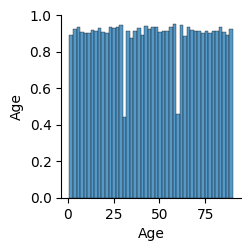

In [9]:
sns.pairplot(data=df)
plt.show()

# Gender

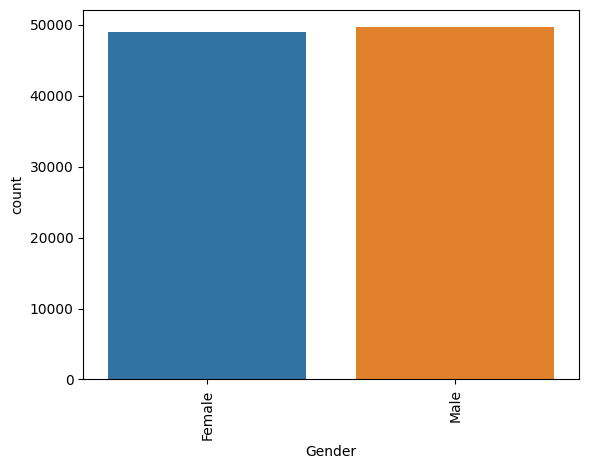

In [10]:
sns.countplot(data=df,x='Gender')
plt.xticks(rotation=90)
plt.show()

fig = px.bar(df, x='Gender', title='Count of Passengers by Gender')
fig.show()

# Continents

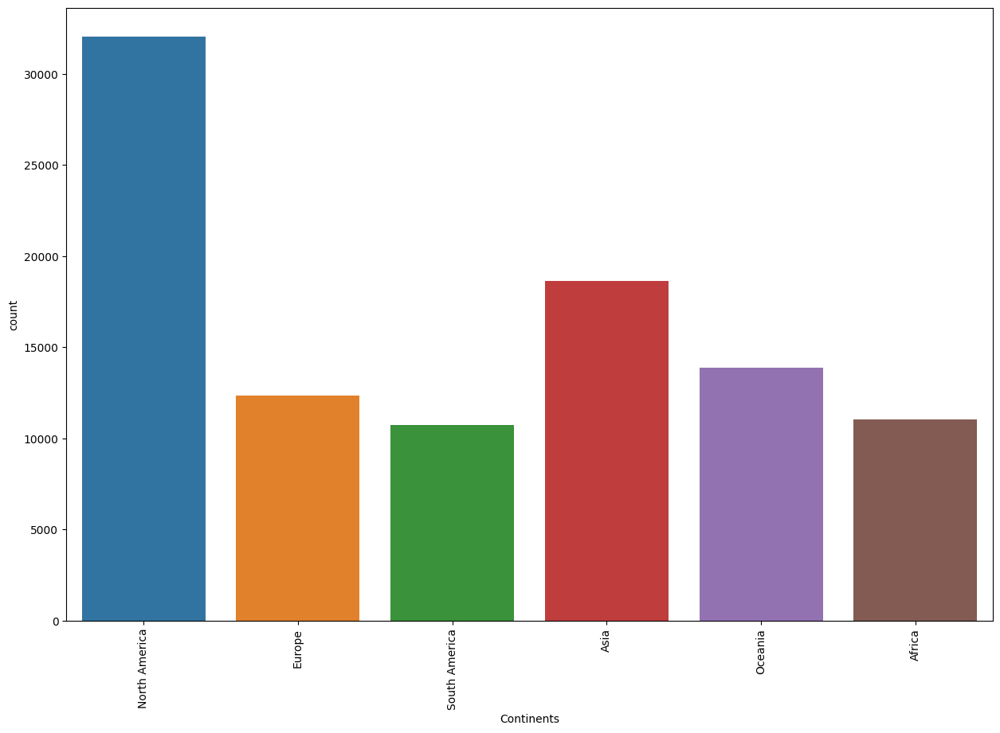

In [11]:
plt.figure(figsize=(15,10))
sns.countplot(data=df,x='Continents')
plt.xticks(rotation=90)
plt.show()

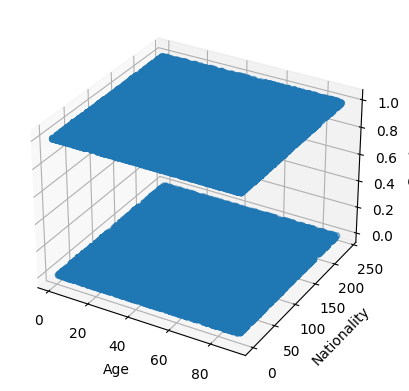

In [12]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Convert categorical variable to numeric
df['Nationality_num'] = df['Nationality'].astype('category').cat.codes
df['Gender_num'] = df['Gender'].astype('category').cat.codes

ax.scatter(df['Age'], df['Nationality_num'], df['Gender_num'])

ax.set_xlabel('Age')
ax.set_ylabel('Nationality')
ax.set_zlabel('Gender')

plt.show()


# Age vs Flight Status

In [13]:
fig = px.scatter(df, x='Age', y='Flight Status', color='Gender',
                 title='Scatter Plot of Age vs Flight Status',
                 labels={'Age': 'Passenger Age', 'Flight Status': 'Status'})
fig.show()


# Passenger Age

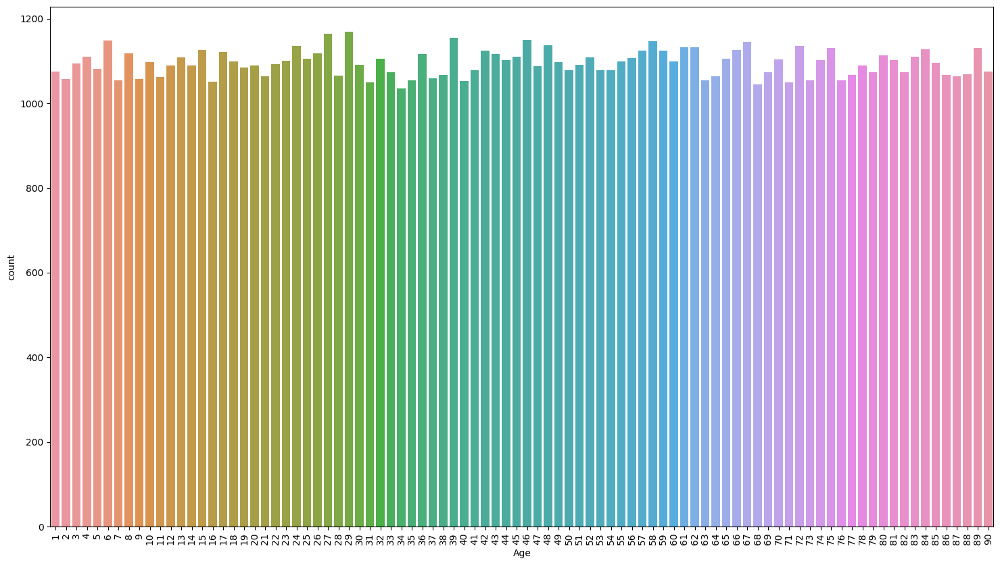

In [14]:
fig = px.histogram(df, x='Age', nbins=20, color='Gender',
                   title='Histogram of Passenger Age',
                   labels={'Age': 'Passenger Age'})
fig.show()


plt.figure(figsize=(18,10))
sns.countplot(data=df,x='Age')
plt.xticks(rotation=90)
plt.show()



# Top 10 Countries with Most Passengers

In [15]:
top_countries = df['Country Name'].value_counts().head(10)
fig = px.bar(top_countries, x=top_countries.index, y=top_countries.values,
             title='Top 10 Countries with Most Passengers',
             labels={'x': 'Country', 'y': 'Passenger Count'})
fig.show()


# Distribution of Flight Status

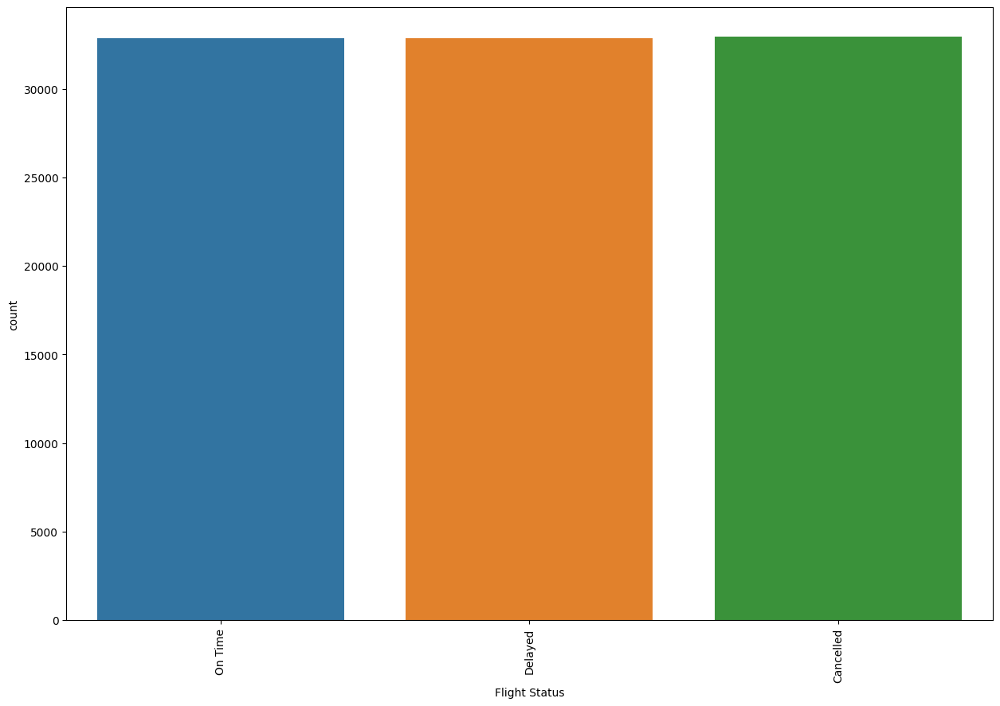

In [16]:
flight_status_counts = df['Flight Status'].value_counts()
fig = px.pie(flight_status_counts, values=flight_status_counts.values,
             names=flight_status_counts.index,
             title='Distribution of Flight Status')
fig.show()


plt.figure(figsize=(15,10))
sns.countplot(data=df,x='Flight Status')
plt.xticks(rotation=90)
plt.show()

# Age by Gender

In [17]:
fig = px.box(df, x='Gender', y='Age', color='Gender',
             title='Box Plot of Age by Gender',
             labels={'Age': 'Passenger Age'})
fig.show()


# Passenger Age

In [18]:
fig = px.violin(df, x='Gender', y='Age', color='Gender',
                title='Violin Plot of Age by Gender',
                labels={'Age': 'Passenger Age'})
fig.show()

# Time Series of Passenger Count Over Departure Dates

In [19]:
df['Departure Date'] = pd.to_datetime(df['Departure Date'])
fig = px.line(df, x='Departure Date', y='Passenger ID',
              title='Time Series of Passenger Count Over Departure Dates')
fig.show()


# Age and Flight Status

In [20]:
fig = px.scatter_matrix(df, dimensions=['Age', 'Flight Status'],
                        color='Gender', title='Scatter Matrix of Age and Flight Status')
fig.show()


fig = px.box(df, x='Flight Status', y='Age', color='Flight Status',
             title='Box Plot of Age by Flight Status',
             labels={'Age': 'Passenger Age'})
fig.show()


fig = px.density_heatmap(df, x='Age', y='Flight Status',
                         title='Kernel Density Estimation of Age and Flight Status')
fig.show()

# Nationality Distribution

In [21]:
nationality_counts = df['Nationality'].value_counts().reset_index()
nationality_counts.columns = ['Nationality', 'Count']
fig = px.pie(nationality_counts, values='Count', names='Nationality',
             title='Distribution of Passengers by Nationality')
fig.show()


# 3D Line Plot Age vs Flight Status vs Passenger ID

In [22]:
fig = px.scatter_3d(df, x='Age', y='Flight Status', z='Passenger ID', color='Gender',
                    title='3D Scatter Plot')
fig.show()



fig = px.line_3d(df, x='Age', y='Flight Status', z='Passenger ID', color='Gender',
                 title='3D Line Plot')
fig.show()

## ****Modelling

In [23]:
data = pd.read_csv('/kaggle/input/airline-dataset/Airline Dataset Updated.csv')

# Data splitting

In [24]:
X = data.drop(columns=['Flight Status'])
y = data['Flight Status']

# One-Hot Encoding

In [25]:
label_encoders = {}
for col in X.columns:
    if X[col].dtype == 'object':
        le = LabelEncoder()
        X[col] = le.fit_transform(X[col])
        label_encoders[col] = le

In [26]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Model

In [27]:
classifiers = {
    'Random Forest': RandomForestClassifier(),
    'Logistic Regression': LogisticRegression(),
}

In [28]:
results = []

# Train and evaluate each classifier
for name, clf in classifiers.items():
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    results.append({'Model': name, 'Accuracy': accuracy})

# Create a DataFrame from the list of results
results_df = pd.DataFrame(results)

# Evaluation

In [31]:
import plotly.graph_objects as go 

# Create a bar plot using Plotly
fig = go.Figure(data=[go.Bar(
    x=results_df['Model'],
    y=results_df['Accuracy'],
    text=results_df['Accuracy'],  # Display accuracy as text on the bars
    textposition='outside',  # Position the text outside the bars
)])

# Customize the plot layout
fig.update_layout(
    xaxis_title='Model',
    yaxis_title='Accuracy',
    title='Model Accuracy Comparison',
    xaxis_tickangle=-45  # Rotate x-axis labels for better readability
)

# Show the plot
fig.show()

In [30]:
# Create a 3D scatter plot
fig = px.scatter_3d(results, x='Model', y='Accuracy', z=[0] * len(results), color='Accuracy', text='Model')

# Customize the plot layout
fig.update_traces(marker=dict(size=12, opacity=0.8),
                  selector=dict(mode='markers+text'))

fig.update_layout(scene=dict(zaxis=dict(range=[0, 1])),
                  title='Model Accuracy Comparison',
                  margin=dict(l=0, r=0, b=0, t=0))

# Show the plot
fig.show()
